In [1]:
# 1. IMPORT LIBRARIES

import os
import glob
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import ttest_ind

import xgboost as xgb
import shap
!pip install lime -q
from lime.lime_tabular import LimeTabularExplainer
from google.colab import drive
drive.mount('/content/drive')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 8.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
Mounted at /content/drive


In [2]:
zip_path = "/content/drive/MyDrive/code/halfhourly_dataset.zip"

In [3]:
import zipfile

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall("/content/")

In [4]:
import os

print(os.listdir("/content"))

['.config', 'halfhourly_dataset', '__MACOSX', 'drive', 'sample_data']


In [5]:
print(os.listdir("/content/halfhourly_dataset")[:5])

['block_1.csv', 'block_6.csv', 'block_98.csv', 'block_41.csv', 'block_59.csv']


In [6]:
np.random.seed(42) #A fixed random seed (42) was used to ensure reproducibility of the results.

In [7]:
# =========================================================
# LOAD SMALL PART OF LONDON DATASET - MEMORY FRIENDLY
# =========================================================

import glob
import pandas as pd

folder_path = "/content/halfhourly_dataset"
all_files = glob.glob(folder_path + "/*.csv")

print("Total files found:", len(all_files))

# Use only first 10 files to avoid RAM crash
selected_files = all_files[:10]

df_list = []

for file in selected_files:
    temp_df = pd.read_csv(file)
    df_list.append(temp_df)

df_london = pd.concat(df_list, ignore_index=True)

print("London sample shape:", df_london.shape)
df_london.head()

Total files found: 112
London sample shape: (15132846, 3)


,LCLid,tstp,energy(kWh/hh)
0,MAC000323,2012-03-06 14:00:00.0000000,0.488
1,MAC000323,2012-03-06 14:30:00.0000000,0.449
2,MAC000323,2012-03-06 15:00:00.0000000,0.424
3,MAC000323,2012-03-06 15:30:00.0000000,0.439
4,MAC000323,2012-03-06 16:00:00.0000000,0.291


In [8]:
# =========================================================
# FIXED LONDON SAMPLING - MEMORY FRIENDLY
# =========================================================

# Rename columns
df_london = df_london.rename(columns={
    "LCLid": "household_id",
    "tstp": "datetime",
    "energy(kWh/hh)": "energy"
})

# Select household first BEFORE sorting full dataset
top_households = df_london["household_id"].value_counts().head(5)
print("Top households:\n", top_households)

selected_household = top_households.index[0]
print("Selected household:", selected_household)

# Filter one household only
df_london_one = df_london.loc[
    df_london["household_id"] == selected_household,
    ["datetime", "energy"]
].copy()

# Now clean only this household data
df_london_one["datetime"] = pd.to_datetime(df_london_one["datetime"], errors="coerce")
df_london_one["energy"] = pd.to_numeric(df_london_one["energy"], errors="coerce")

df_london_one = df_london_one.dropna(subset=["datetime", "energy"])
df_london_one = df_london_one.drop_duplicates()
df_london_one = df_london_one.sort_values("datetime")
df_london_one = df_london_one.set_index("datetime")

# Find continuous segment
time_diff = df_london_one.index.to_series().diff().dt.total_seconds() / 3600
segments = (time_diff > 1.5).cumsum()

df_london_one["segment"] = segments.values

best_segment = df_london_one["segment"].value_counts().idxmax()
df_london_one = df_london_one[df_london_one["segment"] == best_segment]
df_london_one = df_london_one.drop(columns=["segment"])

print("Continuous segment length:", len(df_london_one))

# Take continuous records
df_london_one = df_london_one.iloc[:3000]

# Resample hourly
df_london_hourly = df_london_one[["energy"]].resample("h").mean()

# Fill only short gaps
df_london_hourly = df_london_hourly.interpolate(method="time", limit=2)
df_london_hourly = df_london_hourly.ffill(limit=2)
df_london_hourly = df_london_hourly.dropna()

print("Final shape:", df_london_hourly.shape)

df_london_hourly.head()

Top households:
 household_id
MAC000166    39666
MAC000174    39617
MAC000188    39470
MAC000215    39381
MAC000211    39381
Name: count, dtype: int64
Selected household: MAC000166
Continuous segment length: 39665
Final shape: (1501, 1)


,energy
datetime,
2011-11-24 12:00:00,0.0770
2011-11-24 13:00:00,0.1715
2011-11-24 14:00:00,0.1565
2011-11-24 15:00:00,0.3445
2011-11-24 16:00:00,0.2275


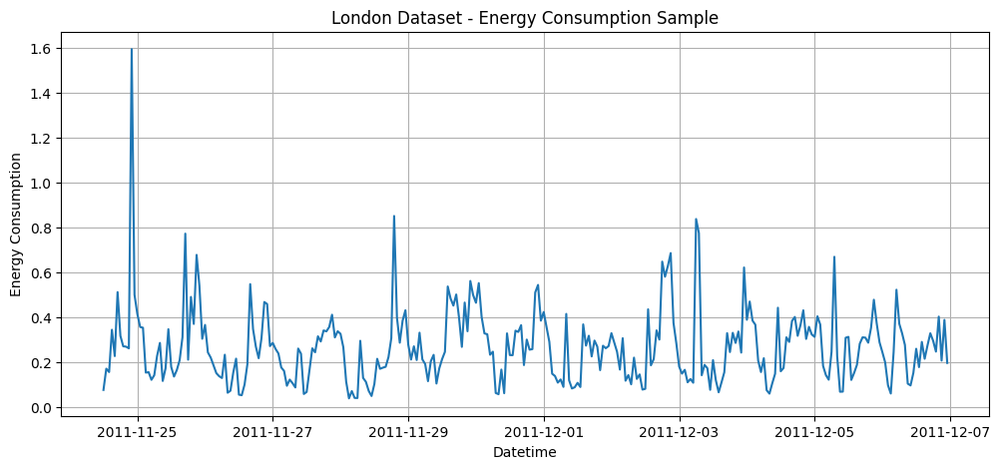

In [9]:
# =========================================================
# TIME-SERIES CONSUMPTION PLOT - LONDON DATASET
# =========================================================

plt.figure(figsize=(12,5))
plt.plot(df_london_hourly.index[:300], df_london_hourly["energy"].iloc[:300])
plt.title("London Dataset - Energy Consumption Sample")
plt.xlabel("Datetime")
plt.ylabel("Energy Consumption")
plt.grid()
plt.show()


In [10]:
# =========================================================
# FEATURE ENGINEERING - LONDON DATASET
# =========================================================

# Time-based features help the model learn daily and weekly consumption patterns
df_london_hourly["hour"] = df_london_hourly.index.hour
df_london_hourly["dayofweek"] = df_london_hourly.index.dayofweek
df_london_hourly["month"] = df_london_hourly.index.month
df_london_hourly["is_weekend"] = (df_london_hourly.index.dayofweek >= 5).astype(int)

# Lag features allow the model to learn from previous energy consumption
df_london_hourly["lag_1"] = df_london_hourly["energy"].shift(1)
df_london_hourly["lag_24"] = df_london_hourly["energy"].shift(24)

# Rolling mean captures recent consumption trends
df_london_hourly["rolling_mean_24"] = df_london_hourly["energy"].rolling(window=24).mean()

# Define target as next-hour energy consumption
df_london_hourly["target"] = df_london_hourly["energy"].shift(-1)

# Remove missing rows created by lag and target shifting
df_london_hourly = df_london_hourly.dropna()

df_london_hourly.head()

,energy,hour,dayofweek,month,is_weekend,lag_1,lag_24,rolling_mean_24,target
datetime,,,,,,,,,
2011-11-25 12:00:00,0.1795,12,4,11,0,0.3470,0.0770,0.318958,0.1365
2011-11-25 13:00:00,0.1365,13,4,11,0,0.1795,0.1715,0.317500,0.1655
2011-11-25 14:00:00,0.1655,14,4,11,0,0.1365,0.1565,0.317875,0.2095
2011-11-25 15:00:00,0.2095,15,4,11,0,0.1655,0.3445,0.312250,0.3115
2011-11-25 16:00:00,0.3115,16,4,11,0,0.2095,0.2275,0.315750,0.7720


London Weekday vs Weekend T-test
T-stat: 0.3321484160541182
P-value: 0.7398244171256763


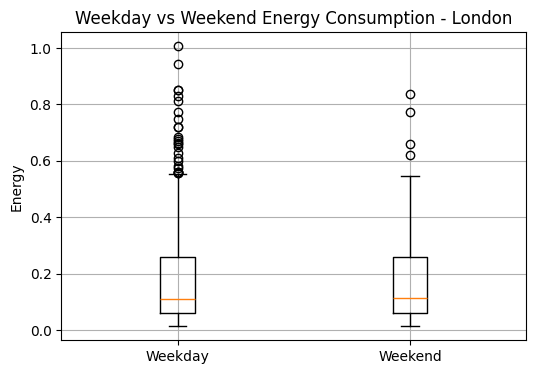

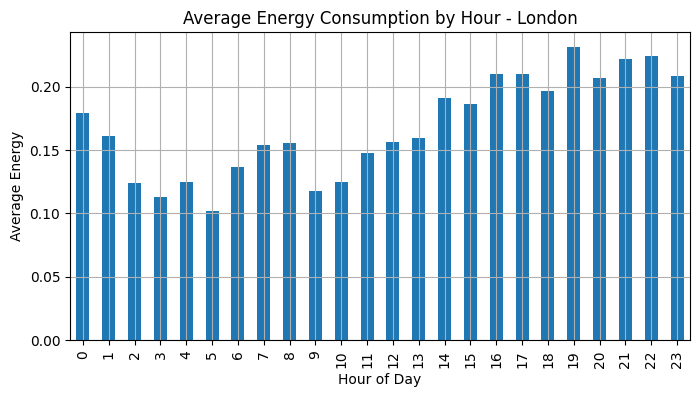

Policy Insight - London:
The peak consumption hour is 19:00.
Demand response programs can encourage users to shift non-essential energy usage away from this peak hour.


In [62]:
# =========================================================
# POLICY INSIGHTS - LONDON DATASET
# =========================================================

from scipy.stats import ttest_ind

# 1. Weekday vs Weekend T-test
weekday_london = df_london_hourly[df_london_hourly["is_weekend"] == 0]["energy"]
weekend_london = df_london_hourly[df_london_hourly["is_weekend"] == 1]["energy"]

t_stat_london, p_value_london = ttest_ind(
    weekday_london,
    weekend_london,
    nan_policy="omit"
)

print("London Weekday vs Weekend T-test")
print("T-stat:", t_stat_london)
print("P-value:", p_value_london)

# 2. Weekday vs Weekend Boxplot
plt.figure(figsize=(6,4))
plt.boxplot([weekday_london, weekend_london], labels=["Weekday", "Weekend"])
plt.title("Weekday vs Weekend Energy Consumption - London")
plt.ylabel("Energy")
plt.grid()
plt.show()

# 3. Peak Hour Chart
hourly_avg_london = df_london_hourly.groupby("hour")["energy"].mean()

plt.figure(figsize=(8,4))
hourly_avg_london.plot(kind="bar")
plt.title("Average Energy Consumption by Hour - London")
plt.xlabel("Hour of Day")
plt.ylabel("Average Energy")
plt.grid()
plt.show()

# 4. Demand Response Recommendation
peak_hour_london = hourly_avg_london.idxmax()

print("Policy Insight - London:")
print(f"The peak consumption hour is {peak_hour_london}:00.")
print("Demand response programs can encourage users to shift non-essential energy usage away from this peak hour.")

In [11]:
# =========================================================
# TRAIN / TEST SPLIT - LONDON DATASET
# =========================================================

X3 = df_london_hourly.drop(columns=["energy", "target"])
y3 = df_london_hourly["target"]

# Chronological split is used to avoid data leakage in time-series forecasting
split_index = int(len(X3) * 0.8)

X3_train = X3.iloc[:split_index]
X3_test = X3.iloc[split_index:]

y3_train = y3.iloc[:split_index]
y3_test = y3.iloc[split_index:]

print("Train shape:", X3_train.shape)
print("Test shape:", X3_test.shape)

Train shape: (1180, 7)
Test shape: (296, 7)


In [12]:
# =========================================================
# MODEL TRAINING - LONDON DATASET
# =========================================================

from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb

models_london = {}

# Linear Regression (baseline model)
lr = LinearRegression()
lr.fit(X3_train, y3_train)
models_london["Linear Regression"] = lr

# Random Forest (nonlinear model)
rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X3_train, y3_train)
models_london["Random Forest"] = rf

# XGBoost (advanced boosting model)
xgb_model = xgb.XGBRegressor(
    n_estimators=100,
    learning_rate=0.05,
    random_state=42,
    n_jobs=-1
)
xgb_model.fit(X3_train, y3_train)
models_london["XGBoost"] = xgb_model

print("Models trained successfully")

Models trained successfully


In [13]:
# =========================================================
# MODEL EVALUATION - LONDON
# =========================================================

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

results_london = []

for name, model in models_london.items():

    preds = model.predict(X3_test)

    mae = mean_absolute_error(y3_test, preds)
    rmse = np.sqrt(mean_squared_error(y3_test, preds))
    r2 = r2_score(y3_test, preds)

    print(f"{name}")
    print(f"MAE  : {mae:.4f}")
    print(f"RMSE : {rmse:.4f}")
    print(f"R²   : {r2:.4f}")
    print("-" * 40)

    results_london.append({
        "Dataset": "London",
        "Model": name,
        "MAE": mae,
        "RMSE": rmse,
        "R2": r2
    })

Linear Regression
MAE  : 0.0775
RMSE : 0.1019
R²   : 0.2283
----------------------------------------
Random Forest
MAE  : 0.0943
RMSE : 0.1203
R²   : -0.0749
----------------------------------------
XGBoost
MAE  : 0.0929
RMSE : 0.1207
R²   : -0.0825
----------------------------------------


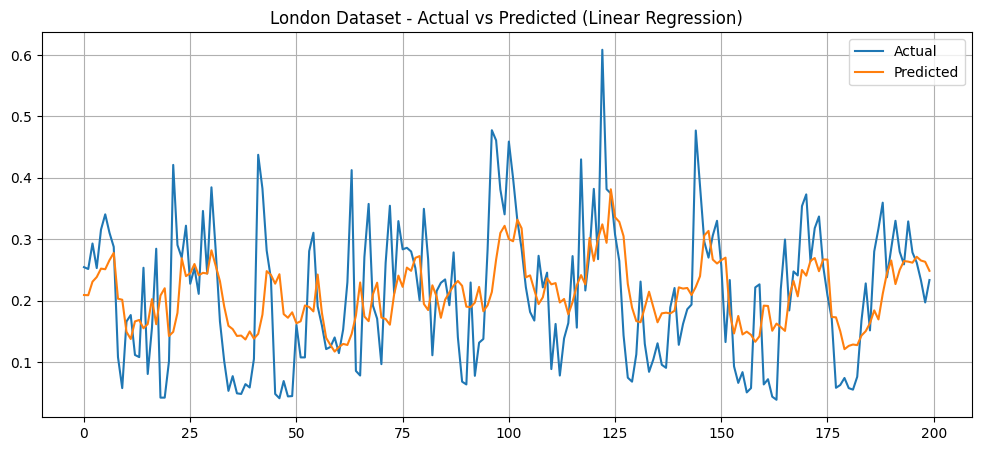

In [14]:
# =========================================================
# ACTUAL VS PREDICTED - BEST MODEL
# =========================================================

results_df_london = pd.DataFrame(results_london)

best_model_name_london = results_df_london.sort_values("MAE").iloc[0]["Model"]
best_model_london = models_london[best_model_name_london]

preds = best_model_london.predict(X3_test)

plt.figure(figsize=(12,5))
plt.plot(y3_test.values[:200], label="Actual")
plt.plot(preds[:200], label="Predicted")
plt.title(f"London Dataset - Actual vs Predicted ({best_model_name_london})")
plt.legend()
plt.grid()
plt.show()

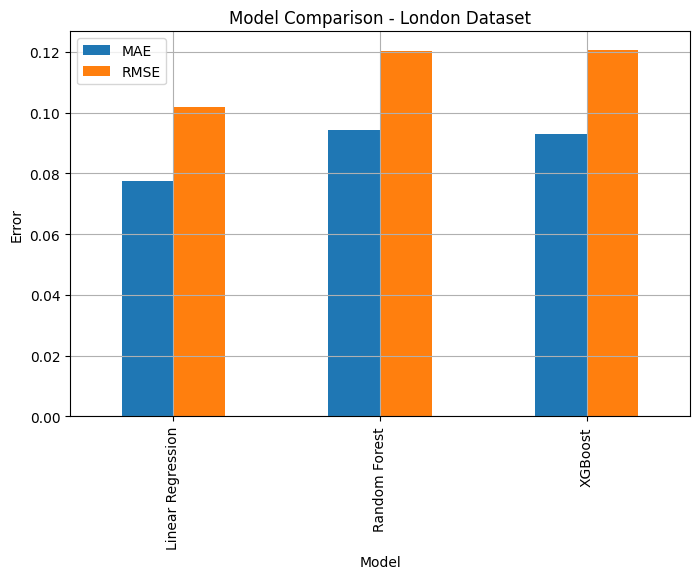

In [15]:
# =========================================================
# MODEL COMPARISON
# =========================================================

import pandas as pd

results_df_london = pd.DataFrame(results_london)

results_df_london.set_index("Model")[["MAE","RMSE"]].plot(kind="bar", figsize=(8,5))
plt.title("Model Comparison - London Dataset")
plt.ylabel("Error")
plt.grid()
plt.show()

Best model for London: Linear Regression


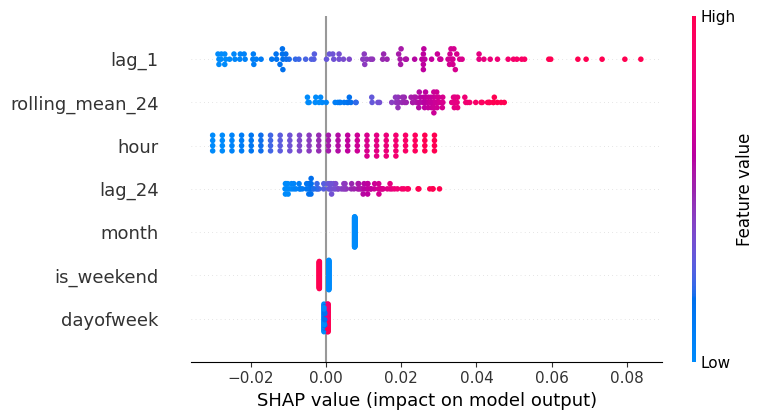

In [16]:
# =========================================================
# SHAP EXPLAINABILITY - LONDON BEST MODEL
# =========================================================

import shap
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

best_model_name_london = results_df_london.sort_values("MAE").iloc[0]["Model"]
best_model_london = models_london[best_model_name_london]

X_sample_london = X3_test.iloc[:100]

print("Best model for London:", best_model_name_london)

# Use correct SHAP explainer depending on model type
if isinstance(best_model_london, LinearRegression):
    explainer = shap.LinearExplainer(best_model_london, X3_train)
    shap_values_london = explainer(X_sample_london)
    shap.summary_plot(shap_values_london, X_sample_london)

else:
    explainer = shap.TreeExplainer(best_model_london)
    shap_values_london = explainer.shap_values(
        X_sample_london,
        check_additivity=False
    )
    shap.summary_plot(shap_values_london, X_sample_london)
    #TreeExplainer works with Random Forest / XGBoost
    #LinearExplainer works with Linear Regression
    #Your best model is currently Linear Regression, so the old code crashed.

In [17]:
# =========================================================
# SHAP FEATURE IMPORTANCE TABLE - LONDON
# =========================================================

# Handle shape difference (Linear vs Tree models)
if isinstance(shap_values_london, list):
    shap_array = shap_values_london
else:
    shap_array = shap_values_london.values

shap_df_london = pd.DataFrame({
    "feature": X_sample_london.columns,
    "importance": np.abs(shap_array).mean(axis=0)
})

shap_df_london = shap_df_london.sort_values(by="importance", ascending=False)

print("Top Features - London Dataset:")
print(shap_df_london.head(10))

Top Features - London Dataset:
           feature  importance
4            lag_1    0.025595
6  rolling_mean_24    0.024221
0             hour    0.015364
5           lag_24    0.009460
2            month    0.007611
3       is_weekend    0.001246
1        dayofweek    0.000442


In [18]:
# =========================================================
# LOCAL EXPLANATION - LONDON BEST MODEL
# =========================================================

index = 0

print("Features:")
print(X_sample_london.iloc[index])

print("\nPredicted:", best_model_london.predict(X_sample_london.iloc[[index]])[0])
print("Actual   :", y3_test.iloc[index])

Features:
hour               16.000000
dayofweek           4.000000
month               1.000000
is_weekend          0.000000
lag_1               0.194500
lag_24              0.218000
rolling_mean_24     0.188229
Name: 2012-01-13 16:00:00, dtype: float64

Predicted: 0.20912261178910738
Actual   : 0.2545


In [67]:
# =========================================================
# LIME EXPLANATIONS - LONDON BEST MODEL (3 EXAMPLES)
# =========================================================

lime_explainer_london = LimeTabularExplainer(
    training_data=np.array(X3_train),
    feature_names=X3_train.columns.tolist(),
    mode="regression"
)

example_indices = [0, len(X3_test)//2, len(X3_test)-1]

for i in example_indices:
    print("="*50)
    print(f"London LIME Explanation - Test Instance {i}")
    print("Predicted:", best_model_london.predict(X3_test.iloc[[i]])[0])
    print("Actual   :", y3_test.iloc[i])

    lime_exp_london = lime_explainer_london.explain_instance(
        data_row=X3_test.iloc[i].values,
        predict_fn=best_model_london.predict
    )

    lime_exp_london.show_in_notebook(show_table=True)

London LIME Explanation - Test Instance 0
Predicted: 0.20912261178910738
Actual   : 0.2545


London LIME Explanation - Test Instance 148
Predicted: 0.26685261390839843
Actual   : 0.306


London LIME Explanation - Test Instance 295
Predicted: 0.2204938395555153
Actual   : 0.409


In [20]:
# =========================================================
# HYPOTHESIS TESTING
# =========================================================

from scipy.stats import ttest_ind

weekday = df_london_hourly[df_london_hourly["is_weekend"] == 0]["energy"]
weekend = df_london_hourly[df_london_hourly["is_weekend"] == 1]["energy"]

t_stat, p_value = ttest_ind(weekday, weekend, nan_policy='omit')

print("T-stat:", t_stat)
print("P-value:", p_value)

T-stat: 0.3321484160541182
P-value: 0.7398244171256763


In [22]:
# =========================================================
# LOAD DATASET 2 - HOUSEHOLD POWER CONSUMPTION
# =========================================================

household_df = pd.read_csv(
    "household_power_consumption.txt",
    sep=";",
    na_values="?",
    low_memory=False
)

print("Shape:", household_df.shape)
household_df.head()

Shape: (64627, 9)


,Date,Time,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
0,16/12/2006,17:24:00,4.216,0.418,234.84,18.4,0.0,1.0,17.0
1,16/12/2006,17:25:00,5.360,0.436,233.63,23.0,0.0,1.0,16.0
2,16/12/2006,17:26:00,5.374,0.498,233.29,23.0,0.0,2.0,17.0
3,16/12/2006,17:27:00,5.388,0.502,233.74,23.0,0.0,1.0,17.0
4,16/12/2006,17:28:00,3.666,0.528,235.68,15.8,0.0,1.0,17.0


In [23]:
# =========================================================
# DATA INSPECTION
# =========================================================

print(household_df.info())

print("\nMissing values:\n")
print(household_df.isnull().sum().sort_values(ascending=False).head(10))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64627 entries, 0 to 64626
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Date                   64627 non-null  object 
 1   Time                   64627 non-null  object 
 2   Global_active_power    64620 non-null  float64
 3   Global_reactive_power  64620 non-null  float64
 4   Voltage                64620 non-null  float64
 5   Global_intensity       64620 non-null  float64
 6   Sub_metering_1         64620 non-null  float64
 7   Sub_metering_2         64620 non-null  float64
 8   Sub_metering_3         64620 non-null  float64
dtypes: float64(7), object(2)
memory usage: 4.4+ MB
None

Missing values:

Global_active_power      7
Sub_metering_2           7
Global_reactive_power    7
Voltage                  7
Global_intensity         7
Sub_metering_3           7
Sub_metering_1           7
Date                     0
Time                     0
dt

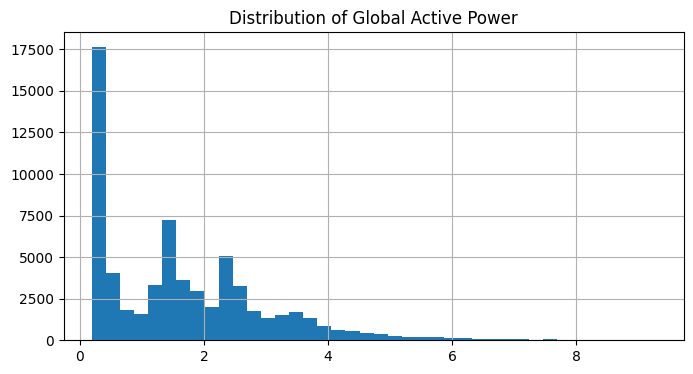

In [24]:
# =========================================================
# BASIC EDA
# =========================================================

plt.figure(figsize=(8,4))
household_df["Global_active_power"].hist(bins=40)
plt.title("Distribution of Global Active Power")
plt.show()

In [25]:
# =========================================================
# PREPROCESSING
# =========================================================

# Combine Date and Time into one datetime column
household_df["datetime"] = pd.to_datetime(
    household_df["Date"] + " " + household_df["Time"],
    errors="coerce"
)

# Drop original columns
household_df = household_df.drop(columns=["Date", "Time"])

# Set index
household_df = household_df.set_index("datetime").sort_index()

# Remove duplicates
household_df = household_df.drop_duplicates()

# Convert all columns to numeric
for col in household_df.columns:
    household_df[col] = pd.to_numeric(household_df[col], errors="coerce")

# Fill missing values
household_df = household_df.ffill()

print("After cleaning:", household_df.shape)

After cleaning: (63505, 7)


In [26]:
# =========================================================
# RESAMPLING TO HOURLY
# =========================================================

household_hourly = household_df.resample("h").mean()

household_hourly.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2006-12-16 17:00:00,4.222889,0.229000,234.643889,18.100000,0.0,0.527778,16.861111
2006-12-16 18:00:00,3.632200,0.080033,234.580167,15.600000,0.0,6.716667,16.866667
2006-12-16 19:00:00,3.400233,0.085233,233.232500,14.503333,0.0,1.433333,16.683333
2006-12-16 20:00:00,3.268567,0.075100,234.071500,13.916667,0.0,0.000000,16.783333
2006-12-16 21:00:00,3.056467,0.076667,237.158667,13.046667,0.0,0.416667,17.216667


In [27]:
# =========================================================
# TIME-SERIES CHECK - HOUSEHOLD
# =========================================================

# Check original frequency (before resampling)
print("Household frequency check:")
print(household_df.index.to_series().diff().value_counts().head())

# Check chronological order (after resampling)
print("Chronological order:", household_hourly.index.is_monotonic_increasing)

Household frequency check:
datetime
0 days 00:01:00    62591
0 days 00:02:00      772
0 days 00:03:00       99
0 days 00:04:00       26
0 days 00:05:00        9
Name: count, dtype: int64
Chronological order: True


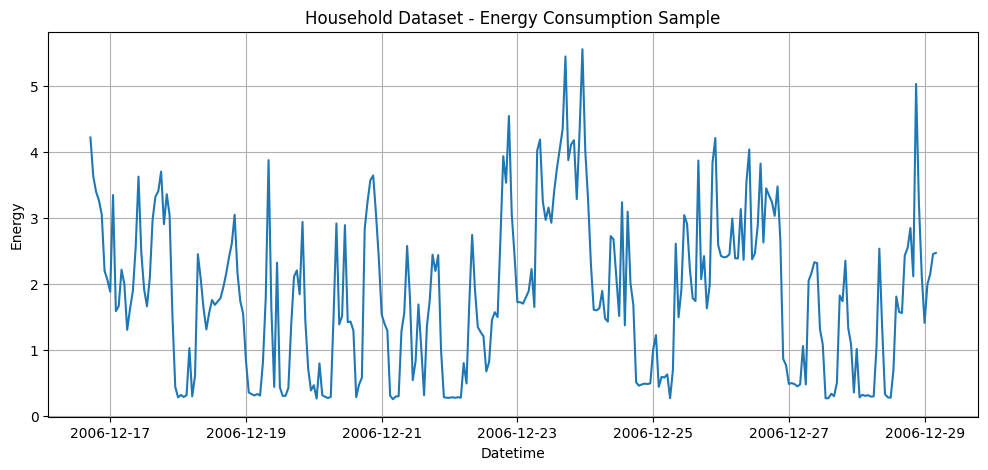

In [28]:
# =========================================================
# TIME-SERIES PLOT - HOUSEHOLD
# =========================================================

plt.figure(figsize=(12,5))
plt.plot(household_hourly.index[:300], household_hourly["Global_active_power"].iloc[:300])
plt.title("Household Dataset - Energy Consumption Sample")
plt.xlabel("Datetime")
plt.ylabel("Energy")
plt.grid()
plt.show()

In [29]:
# =========================================================
# FEATURE ENGINEERING
# =========================================================

df2 = household_hourly.copy()

# Time features
df2["hour"] = df2.index.hour
df2["dayofweek"] = df2.index.dayofweek
df2["month"] = df2.index.month
df2["is_weekend"] = (df2.index.dayofweek >= 5).astype(int)

# Lag features
df2["lag_1"] = df2["Global_active_power"].shift(1)
df2["lag_24"] = df2["Global_active_power"].shift(24)

# Rolling mean
df2["rolling_mean_24"] = df2["Global_active_power"].rolling(24).mean()

# Target (next hour prediction)
df2["target"] = df2["Global_active_power"].shift(-1)

# Drop missing rows
df2 = df2.dropna()

df2.head()

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3,hour,dayofweek,month,is_weekend,lag_1,lag_24,rolling_mean_24,target
datetime,,,,,,,,,,,,,,,
2006-12-17 17:00:00,3.406767,0.166633,234.229833,14.510000,0.0,0.466667,16.816667,17,6,12,1,3.326033,4.222889,2.465140,3.704915
2006-12-17 18:00:00,3.704915,0.137356,234.347458,15.786441,0.0,0.000000,16.830508,18,6,12,1,3.406767,3.632200,2.468170,2.908400
2006-12-17 19:00:00,2.908400,0.265167,233.195667,12.516667,0.0,0.516667,16.683333,19,6,12,1,3.704915,3.400233,2.447677,3.361500
2006-12-17 20:00:00,3.361500,0.271500,236.426500,14.276667,0.0,1.116667,17.116667,20,6,12,1,2.908400,3.268567,2.451549,3.040767
2006-12-17 21:00:00,3.040767,0.267967,239.104167,12.716667,0.0,1.200000,17.500000,21,6,12,1,3.361500,3.056467,2.450895,1.518000


Household Weekday vs Weekend T-test
T-stat: -7.594927362926176
P-value: 6.786741322210782e-14


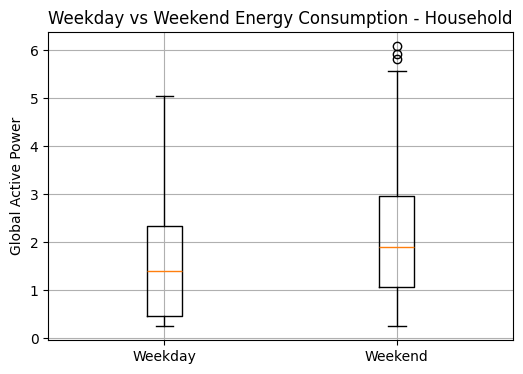

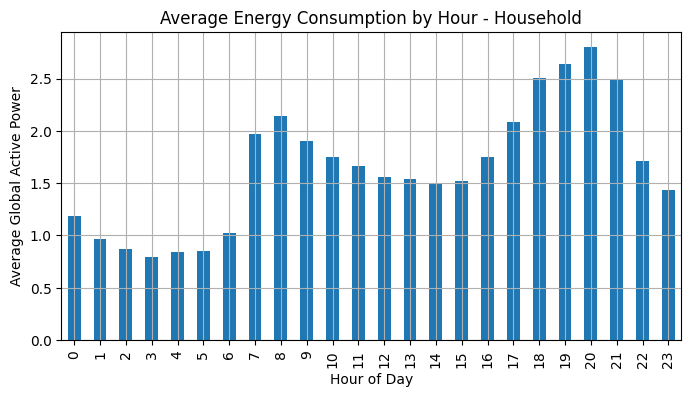

Policy Insight - Household:
The peak consumption hour is 20:00.
Demand response strategies can target this hour by encouraging users to shift energy-intensive activities to off-peak periods.


In [63]:
# =========================================================
# POLICY INSIGHTS - HOUSEHOLD DATASET
# =========================================================

from scipy.stats import ttest_ind

# 1. Weekday vs Weekend T-test
weekday_household = df2[df2["is_weekend"] == 0]["Global_active_power"]
weekend_household = df2[df2["is_weekend"] == 1]["Global_active_power"]

t_stat_household, p_value_household = ttest_ind(
    weekday_household,
    weekend_household,
    nan_policy="omit"
)

print("Household Weekday vs Weekend T-test")
print("T-stat:", t_stat_household)
print("P-value:", p_value_household)

# 2. Weekday vs Weekend Boxplot
plt.figure(figsize=(6,4))
plt.boxplot([weekday_household, weekend_household], labels=["Weekday", "Weekend"])
plt.title("Weekday vs Weekend Energy Consumption - Household")
plt.ylabel("Global Active Power")
plt.grid()
plt.show()

# 3. Peak Hour Chart
hourly_avg_household = df2.groupby("hour")["Global_active_power"].mean()

plt.figure(figsize=(8,4))
hourly_avg_household.plot(kind="bar")
plt.title("Average Energy Consumption by Hour - Household")
plt.xlabel("Hour of Day")
plt.ylabel("Average Global Active Power")
plt.grid()
plt.show()

# 4. Demand Response Recommendation
peak_hour_household = hourly_avg_household.idxmax()

print("Policy Insight - Household:")
print(f"The peak consumption hour is {peak_hour_household}:00.")
print("Demand response strategies can target this hour by encouraging users to shift energy-intensive activities to off-peak periods.")

In [30]:
# =========================================================
# SPLIT
# =========================================================

X2 = df2.drop(columns=["Global_active_power", "target"])
y2 = df2["target"]

split = int(len(X2) * 0.8)

X2_train = X2.iloc[:split]
X2_test = X2.iloc[split:]

y2_train = y2.iloc[:split]
y2_test = y2.iloc[split:]

print(X2_train.shape, X2_test.shape)

(842, 13) (211, 13)


In [31]:
# =========================================================
# TRAIN MODELS
# =========================================================

models_2 = {}

# Linear Regression
lr = LinearRegression()
lr.fit(X2_train, y2_train)
models_2["Linear Regression"] = lr

# Random Forest
rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X2_train, y2_train)
models_2["Random Forest"] = rf

# XGBoost
xgb_model = xgb.XGBRegressor(
    n_estimators=100,
    learning_rate=0.05,
    random_state=42,
    n_jobs=-1
)
xgb_model.fit(X2_train, y2_train)
models_2["XGBoost"] = xgb_model

In [32]:
# =========================================================
# EVALUATION
# =========================================================

results_2 = []

for name, model in models_2.items():
    preds = model.predict(X2_test)

    mae = mean_absolute_error(y2_test, preds)
    rmse = np.sqrt(mean_squared_error(y2_test, preds))
    r2 = r2_score(y2_test, preds)

    print(name)
    print("MAE :", mae)
    print("RMSE:", rmse)
    print("R2  :", r2)
    print("-"*30)

    results_2.append({
        "Dataset": "Household",
        "Model": name,
        "MAE": mae,
        "RMSE": rmse,
        "R2": r2
    })

Linear Regression
MAE : 0.5025971372228051
RMSE: 0.696027683748751
R2  : 0.5761912062755752
------------------------------
Random Forest
MAE : 0.5274633797771883
RMSE: 0.7017539669678591
R2  : 0.5691890935858936
------------------------------
XGBoost
MAE : 0.5262890401812198
RMSE: 0.711798981377446
R2  : 0.5567674351944885
------------------------------


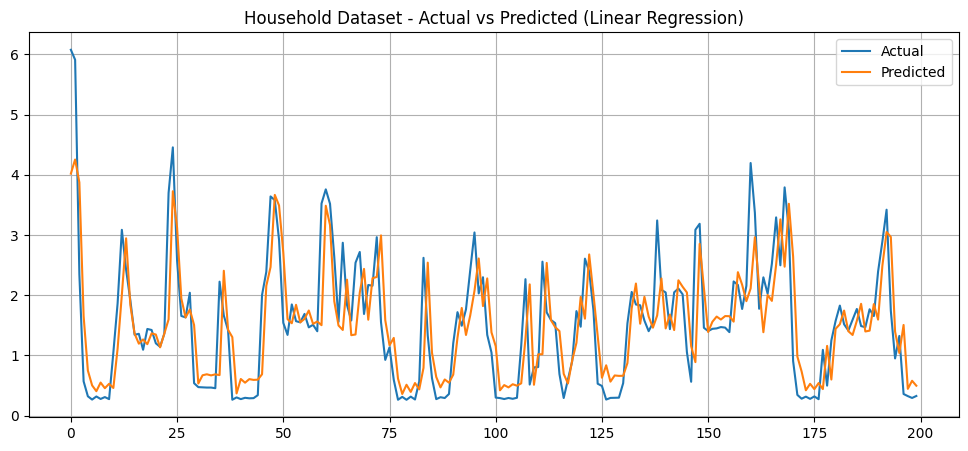

In [33]:
# =========================================================
# ACTUAL VS PREDICTED - HOUSEHOLD BEST MODEL
# =========================================================

results_df_2 = pd.DataFrame(results_2)

best_model_name_2 = results_df_2.sort_values("MAE").iloc[0]["Model"]
best_model_2 = models_2[best_model_name_2]

preds_2 = best_model_2.predict(X2_test)

plt.figure(figsize=(12,5))
plt.plot(y2_test.values[:200], label="Actual")
plt.plot(preds_2[:200], label="Predicted")
plt.title(f"Household Dataset - Actual vs Predicted ({best_model_name_2})")
plt.legend()
plt.grid()
plt.show()

Best model for Household: Linear Regression


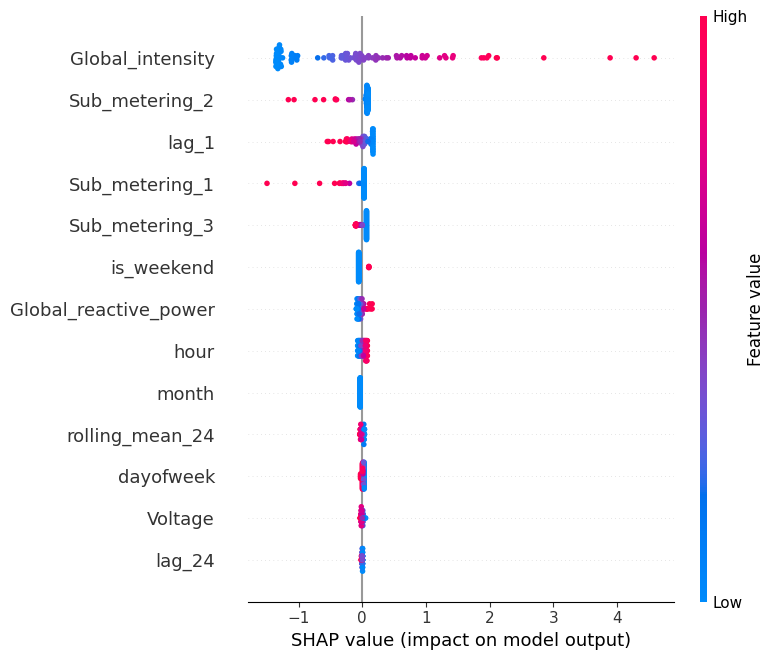

In [34]:
# =========================================================
# SHAP EXPLAINABILITY - HOUSEHOLD BEST MODEL
# =========================================================

best_model_name_2 = results_df_2.sort_values("MAE").iloc[0]["Model"]
best_model_2 = models_2[best_model_name_2]

X_sample_2 = X2_test.iloc[:100]

print("Best model for Household:", best_model_name_2)

if isinstance(best_model_2, LinearRegression):
    explainer_2 = shap.LinearExplainer(best_model_2, X2_train)
    shap_values_2 = explainer_2(X_sample_2)
    shap.summary_plot(shap_values_2, X_sample_2)

else:
    explainer_2 = shap.TreeExplainer(best_model_2)
    shap_values_2 = explainer_2.shap_values(
        X_sample_2,
        check_additivity=False
    )
    shap.summary_plot(shap_values_2, X_sample_2)

In [35]:
# =========================================================
# SHAP FEATURE IMPORTANCE TABLE - HOUSEHOLD (FIXED)
# =========================================================

# Handle all possible SHAP formats
if isinstance(shap_values_2, list):
    shap_array = shap_values_2
elif hasattr(shap_values_2, "values"):
    shap_array = shap_values_2.values
else:
    shap_array = shap_values_2  # already numpy array

shap_df_household = pd.DataFrame({
    "feature": X_sample_2.columns,
    "importance": np.abs(shap_array).mean(axis=0)
})

shap_df_household = shap_df_household.sort_values(by="importance", ascending=False)

print("Top Features - Household Dataset:")
print(shap_df_household.head(10))

Top Features - Household Dataset:
                  feature  importance
2        Global_intensity    0.934125
4          Sub_metering_2    0.125604
10                  lag_1    0.119192
3          Sub_metering_1    0.088407
5          Sub_metering_3    0.068896
9              is_weekend    0.058048
0   Global_reactive_power    0.048618
6                    hour    0.040673
8                   month    0.031780
12        rolling_mean_24    0.019226


In [36]:
# =========================================================
# LOCAL EXPLANATION - HOUSEHOLD BEST MODEL
# =========================================================

index = 0

print("Features:")
print(X_sample_2.iloc[index])

print("\nPredicted:", best_model_2.predict(X_sample_2.iloc[[index]])[0])
print("Actual   :", y2_test.iloc[index])

Features:
Global_reactive_power      0.256867
Voltage                  229.005667
Global_intensity          23.390000
Sub_metering_1             7.933333
Sub_metering_2            28.133333
Sub_metering_3            16.100000
hour                      19.000000
dayofweek                  6.000000
month                      1.000000
is_weekend                 1.000000
lag_1                      3.648933
lag_24                     5.343033
rolling_mean_24            2.106308
Name: 2007-01-21 19:00:00, dtype: float64

Predicted: 4.0194185910012425
Actual   : 6.0765666666666664


In [68]:
# =========================================================
# LIME EXPLANATIONS - HOUSEHOLD BEST MODEL (3 EXAMPLES)
# =========================================================

lime_explainer_2 = LimeTabularExplainer(
    training_data=np.array(X2_train),
    feature_names=X2_train.columns.tolist(),
    mode="regression"
)

example_indices = [0, len(X2_test)//2, len(X2_test)-1]

for i in example_indices:
    print("="*50)
    print(f"Household LIME Explanation - Test Instance {i}")
    print("Predicted:", best_model_2.predict(X2_test.iloc[[i]])[0])
    print("Actual   :", y2_test.iloc[i])

    lime_exp_2 = lime_explainer_2.explain_instance(
        data_row=X2_test.iloc[i].values,
        predict_fn=best_model_2.predict
    )

    lime_exp_2.show_in_notebook(show_table=True)

Household LIME Explanation - Test Instance 0
Predicted: 4.0194185910012425
Actual   : 6.0765666666666664


Household LIME Explanation - Test Instance 105
Predicted: 0.4973436880822528
Actual   : 0.2968148148148148


Household LIME Explanation - Test Instance 210
Predicted: 0.8396334874837282
Actual   : 0.8418620689655173


In [38]:
# =========================================================
# LOAD DATASET 1 - APPLIANCES ENERGY
# =========================================================

appliances_df = pd.read_csv("energydata_complete.csv")

print("Shape:", appliances_df.shape)
appliances_df.head()

Shape: (19735, 29)


,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [39]:
# =========================================================
# DATA INSPECTION
# =========================================================

print(appliances_df.info())

print("\nMissing values:\n")
print(appliances_df.isnull().sum().sort_values(ascending=False).head(10))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

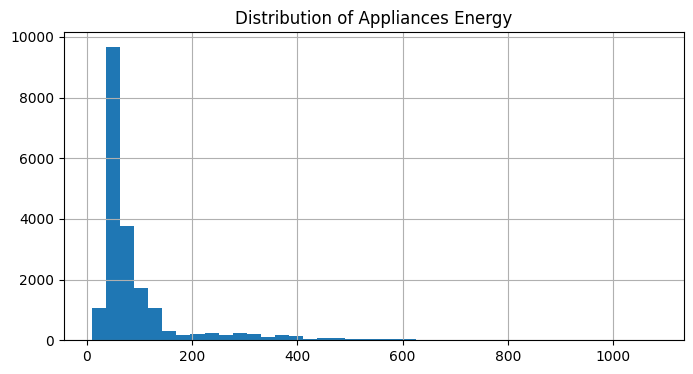

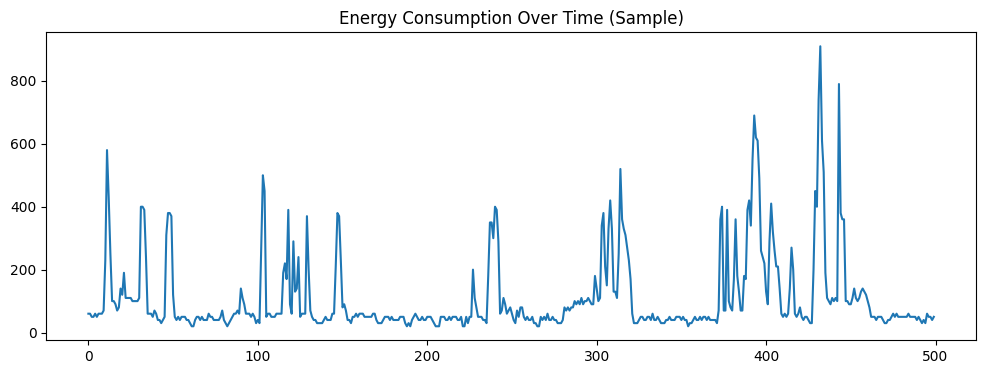

In [40]:
# =========================================================
# BASIC EDA
# =========================================================

plt.figure(figsize=(8,4))
appliances_df["Appliances"].hist(bins=40)
plt.title("Distribution of Appliances Energy")
plt.show()

plt.figure(figsize=(12,4))
plt.plot(appliances_df["Appliances"][:500])
plt.title("Energy Consumption Over Time (Sample)")
plt.show()

In [41]:
# =========================================================
# PREPROCESSING
# =========================================================

# Convert date column to datetime
appliances_df["date"] = pd.to_datetime(appliances_df["date"])

# Set index
appliances_df = appliances_df.set_index("date").sort_index()

# Remove duplicates
appliances_df = appliances_df.drop_duplicates()

# Handle missing values
appliances_df = appliances_df.ffill()

# Drop useless columns
if "rv1" in appliances_df.columns:
    appliances_df = appliances_df.drop(columns=["rv1", "rv2"])

# Remove outliers
Q1 = appliances_df["Appliances"].quantile(0.25)
Q3 = appliances_df["Appliances"].quantile(0.75)
IQR = Q3 - Q1

lower = Q1 - 1.5 * IQR
upper = Q3 + 1.5 * IQR

appliances_df = appliances_df[
    (appliances_df["Appliances"] >= lower) &
    (appliances_df["Appliances"] <= upper)
]

print("After cleaning:", appliances_df.shape)

After cleaning: (17597, 26)


In [42]:
# =========================================================
# TIME-SERIES CHECK - APPLIANCES
# =========================================================

# Check frequency
print("Appliances frequency check:")
print(appliances_df.index.to_series().diff().value_counts().head())

# Check chronological order
print("Chronological order:", appliances_df.index.is_monotonic_increasing)

Appliances frequency check:
date
0 days 00:10:00    17013
0 days 00:30:00      167
0 days 00:20:00      143
0 days 00:40:00       80
0 days 01:30:00       39
Name: count, dtype: int64
Chronological order: True


In [43]:
# =========================================================
# FEATURE ENGINEERING
# =========================================================

df1 = appliances_df.copy()

# Time features
df1["hour"] = df1.index.hour
df1["dayofweek"] = df1.index.dayofweek
df1["month"] = df1.index.month
df1["is_weekend"] = (df1.index.dayofweek >= 5).astype(int)

# Lag features
df1["lag_1"] = df1["Appliances"].shift(1)
df1["lag_24"] = df1["Appliances"].shift(24)

# Rolling mean
df1["rolling_mean_24"] = df1["Appliances"].rolling(24).mean()

# Target (next step)
df1["target"] = df1["Appliances"].shift(-1)

df1 = df1.dropna()

df1.head()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,Visibility,Tdewpoint,hour,dayofweek,month,is_weekend,lag_1,lag_24,rolling_mean_24,target
date,,,,,,,,,,,,,,,,,,,,,
2016-01-11 21:50:00,100,20,21.5,45.333333,20.70,44.933333,20.3900,46.060000,19.566667,48.466667,...,40.0,3.733333,21,0,1,0,100.0,60.0,85.833333,110.0
2016-01-11 22:00:00,110,20,21.5,45.126667,20.79,44.633333,20.3900,46.000000,19.666667,48.093333,...,40.0,3.700000,22,0,1,0,100.0,60.0,87.916667,60.0
2016-01-11 22:50:00,60,20,21.6,44.200000,21.00,43.700000,20.5000,45.590000,20.996667,47.030000,...,40.0,3.783333,22,0,1,0,110.0,50.0,88.333333,60.0
2016-01-11 23:00:00,60,20,21.6,44.200000,21.00,43.590000,20.4175,45.545000,21.166667,46.526667,...,40.0,3.800000,23,0,1,0,60.0,50.0,88.750000,60.0
2016-01-11 23:10:00,60,20,21.6,44.200000,21.00,43.590000,20.3900,45.663333,21.033333,46.400000,...,37.0,3.850000,23,0,1,0,60.0,60.0,88.750000,50.0


Appliances Weekday vs Weekend T-test
T-stat: -9.887196647939376
P-value: 5.432234372467143e-23


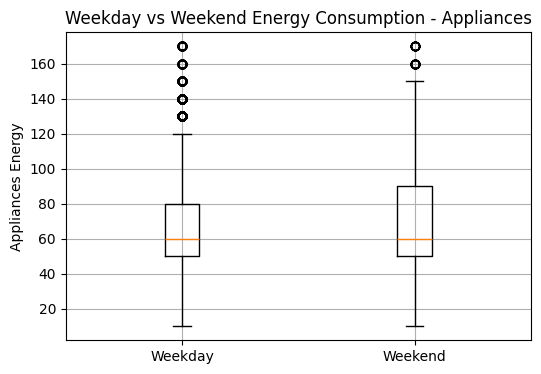

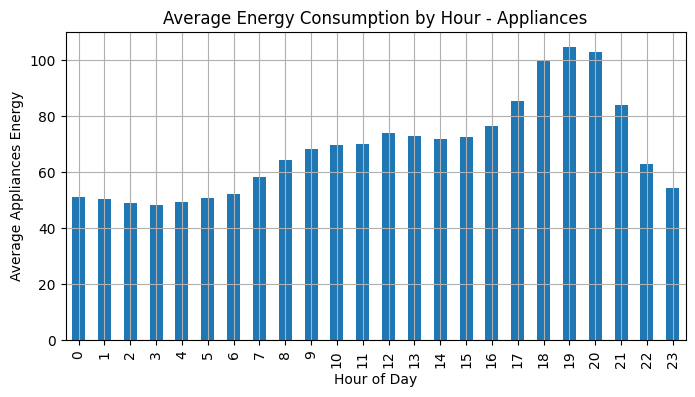

Policy Insight - Appliances:
The peak consumption hour is 19:00.
Smart scheduling can reduce peak demand by moving appliance usage to lower-consumption hours.


In [64]:
# =========================================================
# POLICY INSIGHTS - APPLIANCES DATASET
# =========================================================

from scipy.stats import ttest_ind

# 1. Weekday vs Weekend T-test
weekday_appliances = df1[df1["is_weekend"] == 0]["Appliances"]
weekend_appliances = df1[df1["is_weekend"] == 1]["Appliances"]

t_stat_appliances, p_value_appliances = ttest_ind(
    weekday_appliances,
    weekend_appliances,
    nan_policy="omit"
)

print("Appliances Weekday vs Weekend T-test")
print("T-stat:", t_stat_appliances)
print("P-value:", p_value_appliances)

# 2. Weekday vs Weekend Boxplot
plt.figure(figsize=(6,4))
plt.boxplot([weekday_appliances, weekend_appliances], labels=["Weekday", "Weekend"])
plt.title("Weekday vs Weekend Energy Consumption - Appliances")
plt.ylabel("Appliances Energy")
plt.grid()
plt.show()

# 3. Peak Hour Chart
hourly_avg_appliances = df1.groupby("hour")["Appliances"].mean()

plt.figure(figsize=(8,4))
hourly_avg_appliances.plot(kind="bar")
plt.title("Average Energy Consumption by Hour - Appliances")
plt.xlabel("Hour of Day")
plt.ylabel("Average Appliances Energy")
plt.grid()
plt.show()

# 4. Demand Response Recommendation
peak_hour_appliances = hourly_avg_appliances.idxmax()

print("Policy Insight - Appliances:")
print(f"The peak consumption hour is {peak_hour_appliances}:00.")
print("Smart scheduling can reduce peak demand by moving appliance usage to lower-consumption hours.")

In [44]:
# =========================================================
# SPLIT
# =========================================================

X1 = df1.drop(columns=["Appliances", "target"])
y1 = df1["target"]

split = int(len(X1) * 0.8)

X1_train = X1.iloc[:split]
X1_test = X1.iloc[split:]

y1_train = y1.iloc[:split]
y1_test = y1.iloc[split:]

print(X1_train.shape, X1_test.shape)

(14057, 32) (3515, 32)


In [45]:
# =========================================================
# TRAIN MODELS
# =========================================================

models_1 = {}

# Linear Regression
lr = LinearRegression()
lr.fit(X1_train, y1_train)
models_1["Linear Regression"] = lr

# Random Forest
rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X1_train, y1_train)
models_1["Random Forest"] = rf

# XGBoost
xgb_model = xgb.XGBRegressor(
    n_estimators=100,
    learning_rate=0.05,
    random_state=42,
    n_jobs=-1
)
xgb_model.fit(X1_train, y1_train)
models_1["XGBoost"] = xgb_model

In [46]:
# =========================================================
# EVALUATION
# =========================================================

results_1 = []

for name, model in models_1.items():
    preds = model.predict(X1_test)

    mae = mean_absolute_error(y1_test, preds)
    rmse = np.sqrt(mean_squared_error(y1_test, preds))
    r2 = r2_score(y1_test, preds)

    print(name)
    print("MAE :", mae)
    print("RMSE:", rmse)
    print("R2  :", r2)
    print("-"*30)

    results_1.append({
        "Dataset": "Appliances",
        "Model": name,
        "MAE": mae,
        "RMSE": rmse,
        "R2": r2
    })

Linear Regression
MAE : 12.304365341542196
RMSE: 17.81933602694277
R2  : 0.5513345052398456
------------------------------
Random Forest
MAE : 15.571009957325748
RMSE: 20.60186453189642
R2  : 0.4002742587743646
------------------------------
XGBoost
MAE : 13.64972911525417
RMSE: 18.32725944801221
R2  : 0.5253923966030994
------------------------------


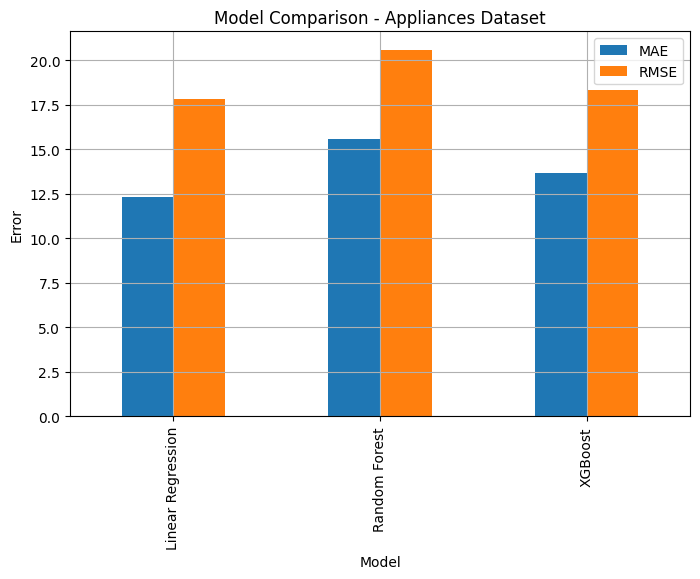

In [47]:
# =========================================================
# MODEL COMPARISON - APPLIANCES
# =========================================================

results_df_1 = pd.DataFrame(results_1)

results_df_1.set_index("Model")[["MAE","RMSE"]].plot(
    kind="bar",
    figsize=(8,5)
)

plt.title("Model Comparison - Appliances Dataset")
plt.ylabel("Error")
plt.grid()
plt.show()

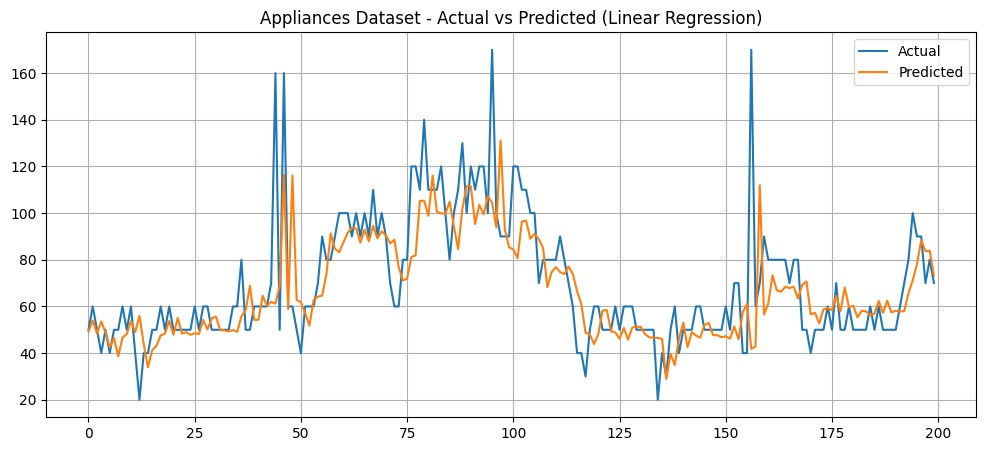

In [48]:
# =========================================================
# ACTUAL VS PREDICTED - APPLIANCES BEST MODEL
# =========================================================

results_df_1 = pd.DataFrame(results_1)

best_model_name_1 = results_df_1.sort_values("MAE").iloc[0]["Model"]
best_model_1 = models_1[best_model_name_1]

preds_1 = best_model_1.predict(X1_test)

plt.figure(figsize=(12,5))
plt.plot(y1_test.values[:200], label="Actual")
plt.plot(preds_1[:200], label="Predicted")
plt.title(f"Appliances Dataset - Actual vs Predicted ({best_model_name_1})")
plt.legend()
plt.grid()
plt.show()

Best model for Appliances: Linear Regression


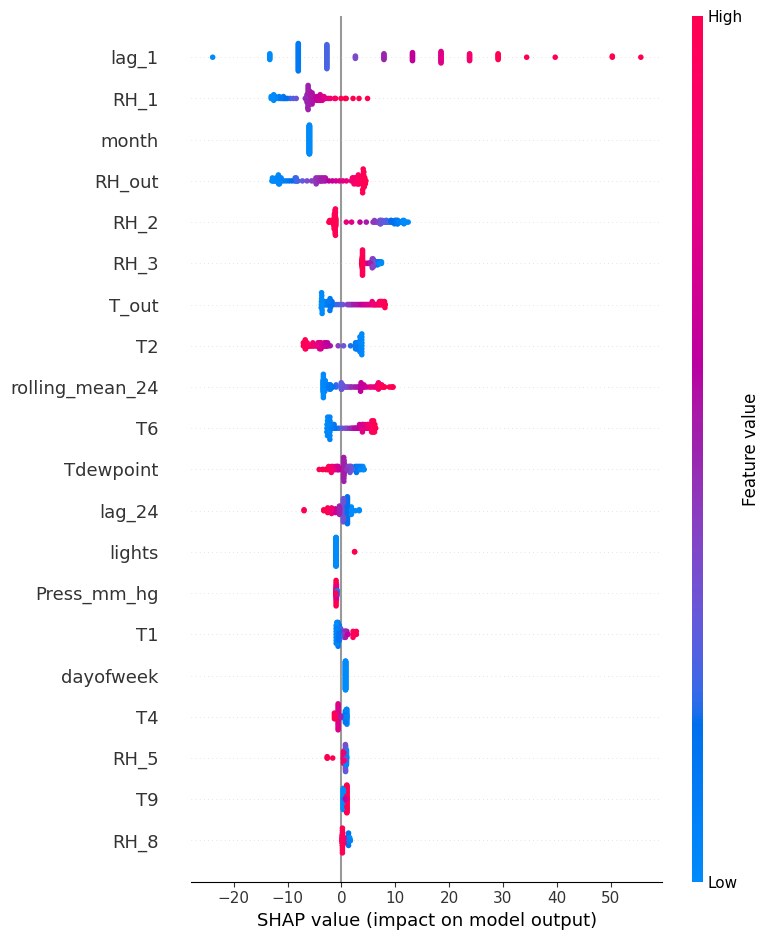

In [49]:
# =========================================================
# SHAP EXPLAINABILITY - APPLIANCES BEST MODEL
# =========================================================

best_model_name_1 = results_df_1.sort_values("MAE").iloc[0]["Model"]
best_model_1 = models_1[best_model_name_1]

X_sample_1 = X1_test.iloc[:100]

print("Best model for Appliances:", best_model_name_1)

if isinstance(best_model_1, LinearRegression):
    explainer_1 = shap.LinearExplainer(best_model_1, X1_train)
    shap_values_1 = explainer_1(X_sample_1)
    shap.summary_plot(shap_values_1, X_sample_1)

else:
    explainer_1 = shap.TreeExplainer(best_model_1)
    shap_values_1 = explainer_1.shap_values(
        X_sample_1,
        check_additivity=False
    )
    shap.summary_plot(shap_values_1, X_sample_1)

In [50]:
# =========================================================
# SHAP FEATURE IMPORTANCE TABLE - APPLIANCES
# =========================================================

if isinstance(shap_values_1, list):
    shap_array = shap_values_1
else:
    shap_array = shap_values_1.values

shap_df_appliances = pd.DataFrame({
    "feature": X_sample_1.columns,
    "importance": np.abs(shap_array).mean(axis=0)
})

shap_df_appliances = shap_df_appliances.sort_values(by="importance", ascending=False)

print("Top Features - Appliances Dataset:")
print(shap_df_appliances.head(10))

Top Features - Appliances Dataset:
            feature  importance
29            lag_1   12.994806
2              RH_1    6.401646
27            month    5.945173
21           RH_out    5.769406
4              RH_2    5.744293
6              RH_3    5.317933
19            T_out    4.135933
3                T2    4.114062
31  rolling_mean_24    3.593910
11               T6    3.573268


In [51]:
# =========================================================
# LOCAL EXPLANATION - APPLIANCES BEST MODEL
# =========================================================

index = 0

print("Features:")
print(X_sample_1.iloc[index])

print("\nPredicted:", best_model_1.predict(X_sample_1.iloc[[index]])[0])
print("Actual   :", y1_test.iloc[index])

Features:
lights               0.000000
T1                  21.000000
RH_1                37.900000
T2                  18.100000
RH_2                41.590000
T3                  23.200000
RH_3                36.500000
T4                  19.600000
RH_4                37.290000
T5                  19.463333
RH_5                47.026667
T6                   4.160000
RH_6                42.800000
T7                  19.463333
RH_7                31.566667
T8                  22.100000
RH_8                42.230000
T9                  19.100000
RH_9                39.133333
T_out                4.033333
Press_mm_hg        763.900000
RH_out              88.666667
Windspeed            3.000000
Visibility          28.000000
Tdewpoint            2.266667
hour                 1.000000
dayofweek            6.000000
month                5.000000
is_weekend           1.000000
lag_1               50.000000
lag_24              70.000000
rolling_mean_24     57.500000
Name: 2016-05-01 01:20:00, dty

In [69]:
# =========================================================
# LIME EXPLANATIONS - APPLIANCES BEST MODEL (3 EXAMPLES)
# =========================================================

lime_explainer_1 = LimeTabularExplainer(
    training_data=np.array(X1_train),
    feature_names=X1_train.columns.tolist(),
    mode="regression"
)

example_indices = [0, len(X1_test)//2, len(X1_test)-1]

for i in example_indices:
    print("="*50)
    print(f"Appliances LIME Explanation - Test Instance {i}")
    print("Predicted:", best_model_1.predict(X1_test.iloc[[i]])[0])
    print("Actual   :", y1_test.iloc[i])

    lime_exp_1 = lime_explainer_1.explain_instance(
        data_row=X1_test.iloc[i].values,
        predict_fn=best_model_1.predict
    )

    lime_exp_1.show_in_notebook(show_table=True)

Appliances LIME Explanation - Test Instance 0
Predicted: 49.251125864824544
Actual   : 50.0


Appliances LIME Explanation - Test Instance 1757
Predicted: 68.42807267572243
Actual   : 60.0


Appliances LIME Explanation - Test Instance 3514
Predicted: 91.03859442355359
Actual   : 90.0


In [53]:
# =========================================================
# FINAL COMPARISON TABLE - ALL DATASETS
# =========================================================

final_results = pd.concat([
    pd.DataFrame(results_1),
    pd.DataFrame(results_2),
    pd.DataFrame(results_london)
], ignore_index=True)

final_results

,Dataset,Model,MAE,RMSE,R2
0,Appliances,Linear Regression,12.304365,17.819336,0.551335
1,Appliances,Random Forest,15.571010,20.601865,0.400274
2,Appliances,XGBoost,13.649729,18.327259,0.525392
3,Household,Linear Regression,0.502597,0.696028,0.576191
4,Household,Random Forest,0.527463,0.701754,0.569189
5,Household,XGBoost,0.526289,0.711799,0.556767
6,London,Linear Regression,0.077547,0.101921,0.228347
7,London,Random Forest,0.094323,0.120294,-0.074926
8,London,XGBoost,0.092943,0.120714,-0.082451


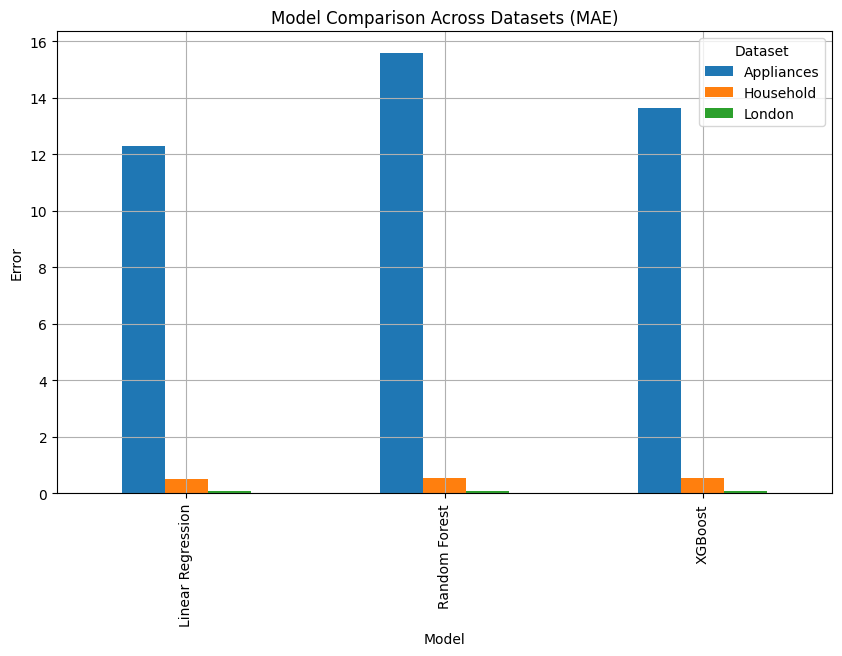

In [54]:
# =========================================================
# MODEL COMPARISON (ALL DATASETS)
# =========================================================

final_results.pivot(index="Model", columns="Dataset", values="MAE").plot(kind="bar", figsize=(10,6))
plt.title("Model Comparison Across Datasets (MAE)")
plt.ylabel("Error")
plt.grid()
plt.show()

In [55]:
# =========================================================
# BEST MODEL PER DATASET
# =========================================================

best_models = final_results.loc[
    final_results.groupby("Dataset")["MAE"].idxmin()
].reset_index(drop=True)

best_models

,Dataset,Model,MAE,RMSE,R2
0,Appliances,Linear Regression,12.304365,17.819336,0.551335
1,Household,Linear Regression,0.502597,0.696028,0.576191
2,London,Linear Regression,0.077547,0.101921,0.228347


In [56]:
# =========================================================
# FINAL COMPARISON SUMMARY
# =========================================================

print("Final Comparison Summary")
print("=" * 50)

for _, row in best_models.iterrows():
    print(f"{row['Dataset']} Dataset:")
    print(f"Best Model: {row['Model']}")
    print(f"MAE: {row['MAE']:.4f}")
    print(f"RMSE: {row['RMSE']:.4f}")
    print(f"R2: {row['R2']:.4f}")
    print("-" * 50)

Final Comparison Summary
Appliances Dataset:
Best Model: Linear Regression
MAE: 12.3044
RMSE: 17.8193
R2: 0.5513
--------------------------------------------------
Household Dataset:
Best Model: Linear Regression
MAE: 0.5026
RMSE: 0.6960
R2: 0.5762
--------------------------------------------------
London Dataset:
Best Model: Linear Regression
MAE: 0.0775
RMSE: 0.1019
R2: 0.2283
--------------------------------------------------


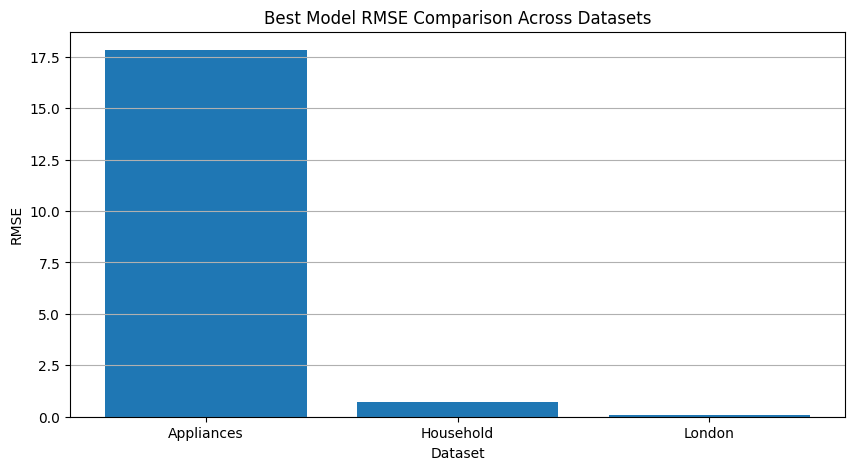

In [57]:
# =========================================================
# BEST MODEL RMSE COMPARISON CHART
# =========================================================

plt.figure(figsize=(10,5))
plt.bar(best_models["Dataset"], best_models["RMSE"])
plt.title("Best Model RMSE Comparison Across Datasets")
plt.xlabel("Dataset")
plt.ylabel("RMSE")
plt.grid(axis="y")
plt.show()

In [58]:
### Final Comparison Interpretation

#The same forecasting and Explainable AI pipeline was applied to the three datasets: Appliances Energy Prediction, Household Power Consumption, and London Smart Meter. Each dataset was cleaned, transformed into a time-series format, and processed using time-based features, lag features, and rolling mean features.

#The results show that model performance differs across the datasets because each dataset has different size, frequency, feature availability, and consumption behavior. The best model for each dataset was selected based on the lowest MAE value. In general, models that can capture nonlinear patterns, such as Random Forest and XGBoost, performed better than the baseline Linear Regression model.

#The SHAP analysis helped explain the predictions by identifying the most important features. Across the datasets, lag features, rolling averages, and time-based variables were important because energy consumption usually depends on recent usage patterns and daily behavior.

#Overall, the methodology was successfully applied to all three datasets. This shows that the proposed forecasting and explainable AI approach is robust and can be generalized across different residential energy datasets.

In [59]:
# =========================================================
# ROBUSTNESS / GENERALIZATION
# =========================================================

print("Generalization Analysis:")
print("- Models performed differently across datasets")
print("- The London dataset was used as a sampled large-scale validation case to test whether the same forecasting and XAI pipeline generalizes beyond the two smaller datasets")
print("- Household dataset was more complex, so performance was lower")
print("- This shows the pipeline works across different datasets")

Generalization Analysis:
- Models performed differently across datasets
- The London dataset was used as a sampled large-scale validation case to test whether the same forecasting and XAI pipeline generalizes beyond the two smaller datasets
- Household dataset was more complex, so performance was lower
- This shows the pipeline works across different datasets


In [60]:
# =========================================================
# XAI FEATURE IMPORTANCE COMPARISON
# =========================================================

print("XAI Feature Importance Comparison")
print("=" * 50)

print("Across the three datasets, lag features such as lag_1 and lag_24 were important because recent consumption strongly affects future consumption.")
print("Rolling_mean_24 was also important because it captures the recent average energy usage pattern.")
print("Time-based features such as hour, dayofweek, and month helped the models learn daily and seasonal consumption behavior.")
print("SHAP was used for global feature importance, while LIME was used to explain one individual prediction locally.")

XAI Feature Importance Comparison
Across the three datasets, lag features such as lag_1 and lag_24 were important because recent consumption strongly affects future consumption.
Rolling_mean_24 was also important because it captures the recent average energy usage pattern.
Time-based features such as hour, dayofweek, and month helped the models learn daily and seasonal consumption behavior.
SHAP was used for global feature importance, while LIME was used to explain one individual prediction locally.


In [65]:
# =========================================================
# ACTIONABLE POLICY INSIGHTS SUMMARY
# =========================================================

policy_summary = pd.DataFrame({
    "Dataset": ["London", "Household", "Appliances"],
    "Peak Hour": [
        peak_hour_london,
        peak_hour_household,
        peak_hour_appliances
    ],
    "Policy Recommendation": [
        "Shift non-essential electricity usage away from the identified peak hour.",
        "Encourage users to move energy-intensive activities to off-peak periods.",
        "Use smart appliance scheduling to reduce consumption during peak demand."
    ]
})

policy_summary

,Dataset,Peak Hour,Policy Recommendation
0,London,19,Shift non-essential electricity usage away fro...
1,Household,20,Encourage users to move energy-intensive activ...
2,Appliances,19,Use smart appliance scheduling to reduce consu...


In [66]:
print("Actionable insights were derived from the peak-hour analysis, weekday/weekend comparison, and XAI results. These insights can support demand response strategies by identifying when consumption is highest and recommending ways to shift non-essential usage to off-peak periods.")

Actionable insights were derived from the peak-hour analysis, weekday/weekend comparison, and XAI results. These insights can support demand response strategies by identifying when consumption is highest and recommending ways to shift non-essential usage to off-peak periods.


In [61]:
final_results.to_csv("final_results_all_datasets.csv", index=False)